## Author: Xiang (Albert) Li
## USC ID: 1892796881
## Github Userid: XiangLi1209
## Created Time: Mar 27th, 2023

###### Disclaimer: This set of homework applies SMOTE to a seriously imbalanced dataset with a large number of features and data points. SMOTE is essentially a time consuming method. You need to start doing this homework early, so that you have enough time to run SMOTE on the full dataset.

### Import Packages

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
import math
import sklearn.metrics
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import itertools
import copy
import os
import shutil
import urllib.request
import csv
import pandas as pd
from scipy.stats import bootstrap
import statistics
from PIL import Image
import warnings

from sklearn.model_selection import RepeatedKFold
from sklearn.feature_selection import RFECV
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LogisticRegressionCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, roc_curve, auc
from sklearn.tree import DecisionTreeClassifier

from sklearn.impute import KNNImputer
from sklearn.preprocessing import MinMaxScaler
from datetime import datetime
import os
import xgboost as xgb


### 1. Tree-Based Methods


#### (a) Download the APS Failure data from: https://archive.ics.uci.edu/ml/datasets/APS+Failure+at+Scania+Trucks . The dataset contains a training set and a test set. The training set contains 60,000 rows, of which 1,000 belong to the positive class and 171 columns, of which one is the class column. All attributes are numeric.

In [2]:
aps_train = pd.read_csv('../data/aps_failure_training_set.csv',header = 14)
aps_test = pd.read_csv('../data/aps_failure_test_set.csv',header = 14)

In [3]:
print('''There are {:.2f} features in the training dataset that have more than 10% 
missing values'''.format(((aps_train=='na').sum()/len(aps_train)>0.1).sum())) 
print('''There are {:.2f} positive class in the training dataset'''
      .format((aps_train['class']=='pos').sum()))
display(aps_train)

There are 28.00 features in the training dataset that have more than 10% 
missing values
There are 1000.00 positive class in the training dataset


,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,76698,na,2130706438,280,0,0,0,0,0,...,1240520,493384,721044,469792,339156,157956,73224,0,0,0
1,neg,33058,na,0,na,0,0,0,0,0,...,421400,178064,293306,245416,133654,81140,97576,1500,0,0
2,neg,41040,na,228,100,0,0,0,0,0,...,277378,159812,423992,409564,320746,158022,95128,514,0,0
3,neg,12,0,70,66,0,10,0,0,0,...,240,46,58,44,10,0,0,0,4,32
4,neg,60874,na,1368,458,0,0,0,0,0,...,622012,229790,405298,347188,286954,311560,433954,1218,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,neg,153002,na,664,186,0,0,0,0,0,...,998500,566884,1290398,1218244,1019768,717762,898642,28588,0,0
59996,neg,2286,na,2130706538,224,0,0,0,0,0,...,10578,6760,21126,68424,136,0,0,0,0,0
59997,neg,112,0,2130706432,18,0,0,0,0,0,...,792,386,452,144,146,2622,0,0,0,0
59998,neg,80292,na,2130706432,494,0,0,0,0,0,...,699352,222654,347378,225724,194440,165070,802280,388422,0,0


In [46]:
print('''There are {:.2f} features in the test dataset that have more than 10% 
missing values'''.format(((aps_test=='na').sum()/len(aps_test)>0.1).sum())) 
print('''There are {:.2f} positive class in the test dataset'''
      .format((aps_test['class']=='pos').sum()))
display(aps_test)

There are 0.00 features in the test dataset that have more than 10% 
missing values
There are 375.00 positive class in the test dataset


,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,60,0,20,12,0,0,0,0,0,...,1098,138,412,654,78,88,0,0,0,0
1,neg,82,0,68,40,0,0,0,0,0,...,1068,276,1620,116,86,462,0,0,0,0
2,neg,66002,2,212,112,0,0,0,0,0,...,495076,380368,440134,269556,1315022,153680,516,0,0,0
3,neg,59816,NaN,1010,936,0,0,0,0,0,...,540820,243270,483302,485332,431376,210074,281662,3232,0,0
4,neg,1814,NaN,156,140,0,0,0,0,0,...,7646,4144,18466,49782,3176,482,76,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15995,neg,81852,NaN,2130706432,892,0,0,0,0,0,...,632658,273242,510354,373918,349840,317840,960024,25566,0,0
15996,neg,18,0,52,46,8,26,0,0,0,...,266,44,46,14,2,0,0,0,0,0
15997,neg,79636,NaN,1670,1518,0,0,0,0,0,...,806832,449962,778826,581558,375498,222866,358934,19548,0,0
15998,neg,110,NaN,36,32,0,0,0,0,0,...,588,210,180,544,1004,1338,74,0,0,0


#### <span style='color:black '>(b) Data Preparation<span>
#### This data set has missing values. When the number of data with missing values is significant, discarding them is not a good idea.  [<sup>1</sup>](#fn1)


#### <span style='color:black '>bi. Research what types of techniques are usually used for dealing with data with missing values. [<sup>2</sup>](#fn2) Pick at least one of them and apply it to this data in the next steps. [<sup>3</sup>](#fn3) <span>

1. Mean/Median imputation: replacing missing values with the mean or median  
2. Regression imputation: using a regression model to estimate missing values  
3. Stochastic regression imputation: uses a stochastic regression model to estimate missing values  
4. Principal component analysis (PCA) imputation: using PCA to estimate missing values 
5. SMOTE (Synthetic Minority Over-sampling Technique): taking a random sample from the minority class and then creating new samples along the line segments that connect the minority sample to its nearest neighbors.  
6. Hot deck imputation: filling in missing values with values from similar records or cases in the same dataset.  
7. Cold deck imputation: filling in missing values with values from external datasets or historical records.
8. KNN imputation: using a KNN model to estimate missing values  


#### <span style='color:black '> bii. For each of the 170 features, calculate the coefficient of variation $ CV = s/m $, where s is sample standard deviation and m is sample mean.<span>

In [7]:
aps_train.replace('na', float('nan'), inplace=True)

X_train = aps_train.iloc[:, 1:]
y_train = aps_train.iloc[:, 0]

In [8]:
# Record the start time
start_time = datetime.now()

# Initialize a KNN imputer with 5 neighbors
imputer1 = KNNImputer(n_neighbors=5)

# Record the end time and calculate the duration
end_time = datetime.now()
duration = end_time - start_time


start_time1 = datetime.now()

# Fill in missing values in the training set
X_train_imputed = imputer1.fit_transform(X_train)

end_time1 = datetime.now()
duration1 = end_time1 - start_time1

start_time2 = datetime.now()

# Convert the imputed data to a pandas dataframe
X_train_imputed_df = pd.DataFrame(X_train_imputed, columns=X_train.columns)
end_time2 = datetime.now()
duration2 = end_time2 - start_time2

print(duration, duration1,duration2)

# Check the number of missing values in the imputed data
print('Number of missing values in the imputed data:', X_train_imputed_df.isnull().sum().sum())

0:00:00.000046 0:17:46.472975 0:00:00.000912
Number of missing values in the imputed data: 0


In [9]:
train_imputed = pd.DataFrame(X_train_imputed)

train_imputed['class'] = aps_train['class']

In [10]:
# try the KNN method on test data

aps_test.replace('na', float('nan'), inplace=True)

# Split the data into features and labels
X_test = aps_test.iloc[:, 1:]
y_test = aps_test.iloc[:, 0]

# Record the start time
start_time = datetime.now()

# Initialize a KNN imputer with 5 neighbors
imputer = KNNImputer(n_neighbors=5)
imputer.fit(X_train)

# Record the end time and calculate the duration
end_time = datetime.now()
duration = end_time - start_time

start_time1 = datetime.now()

# Fill in missing values in the training set
X_test_imputed = imputer.transform(X_test)

end_time1 = datetime.now()
duration1 = end_time1 - start_time1

start_time2 = datetime.now()

# Convert the imputed data to a pandas dataframe
X_test_imputed_df = pd.DataFrame(X_test_imputed, columns=X_test.columns)

end_time2 = datetime.now()
duration2 = end_time2 - start_time2

print(duration, duration1,duration2)

# Check the number of missing values in the imputed data
print('Number of missing values in the imputed test data:', X_test_imputed_df.isnull().sum().sum())

0:00:00.964568 0:04:44.042506 0:00:00.000161
Number of missing values in the imputed test data: 0


In [11]:
test_imputed = pd.DataFrame(X_test_imputed)

test_imputed['class'] = aps_test['class']

len(test_imputed['class'])


16000

In [12]:
cv = X_train_imputed_df.std() / X_train_imputed_df.mean()
cv_df = cv.reset_index()
cv_df.columns = ['feature', 'coefficient_of_variation']
cv_df

,feature,coefficient_of_variation
0,aa_000,2.450938
1,ab_000,3.243660
2,ac_000,2.085589
3,ad_000,244.190147
4,ae_000,22.640198
...,...,...
165,ee_007,4.982442
166,ee_008,3.243067
167,ee_009,5.664604
168,ef_000,46.237554


#### <span style='color:black '>biii. Plot a correlation matrix for your features using pandas or any other tool. <span>

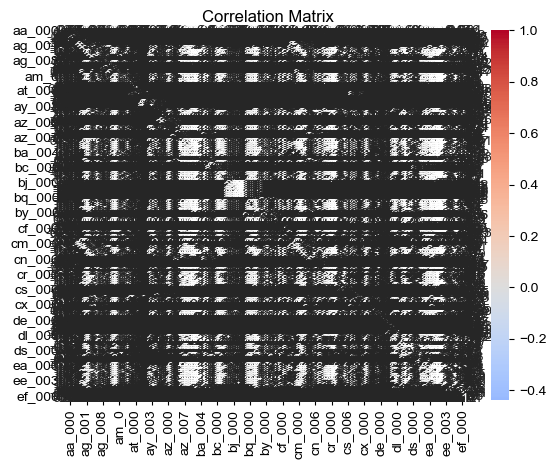

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt

corr_matrix = X_train_imputed_df.corr()
sns.heatmap(corr_matrix, cmap='coolwarm', center=0, annot=True)
sns.set(rc={'figure.figsize':(117,82.7)})
plt.title('Correlation Matrix')
plt.show()

#### <span style='color:black'>biv. Pick $\lfloor \sqrt{170} \rfloor $ featureswith highest CV , and make scatter plots and box plots for them, similar to those on p. 129 of ISLR. Can you draw conclusions about significance of those features, just by the scatter plots? This does not mean that you will only use those features in the following questions. We picked them only for visualization.<span>

In [14]:
# It's the same as picking 13 features

cv_sorted = cv_df.sort_values(by='coefficient_of_variation', ascending=False)[:13]
top13_features = cv_sorted['feature']
print(top13_features)
# Make a scatter plot matrix for each feature

top13_df = X_train_imputed_df[top13_features]
top13_df['class'] = aps_train['class']
display(top13_df)

91     cf_000
109    co_000
3      ad_000
122    cs_009
138    dj_000
136    dh_000
6      ag_000
27     as_000
41     ay_009
51     az_009
93     ch_000
29     au_000
33     ay_001
Name: feature, dtype: object


/var/folders/bl/cyzb7l7939lg7l3437y92vc00000gn/T/ipykernel_92239/860401265.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top13_df['class'] = aps_train['class']


,cf_000,co_000,ad_000,cs_009,dj_000,dh_000,ag_000,as_000,ay_009,az_009,ch_000,au_000,ay_001,class
0,2.0,220.0,280.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,neg
1,1.2,182.4,312.8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,neg
2,0.0,0.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,neg
3,2.0,2.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,neg
4,0.0,202.0,458.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,neg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,0.0,224.0,186.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,neg
59996,2.0,0.0,224.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,neg
59997,2.0,0.0,18.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,neg
59998,2.0,580.0,494.0,0.0,0.0,190.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,neg


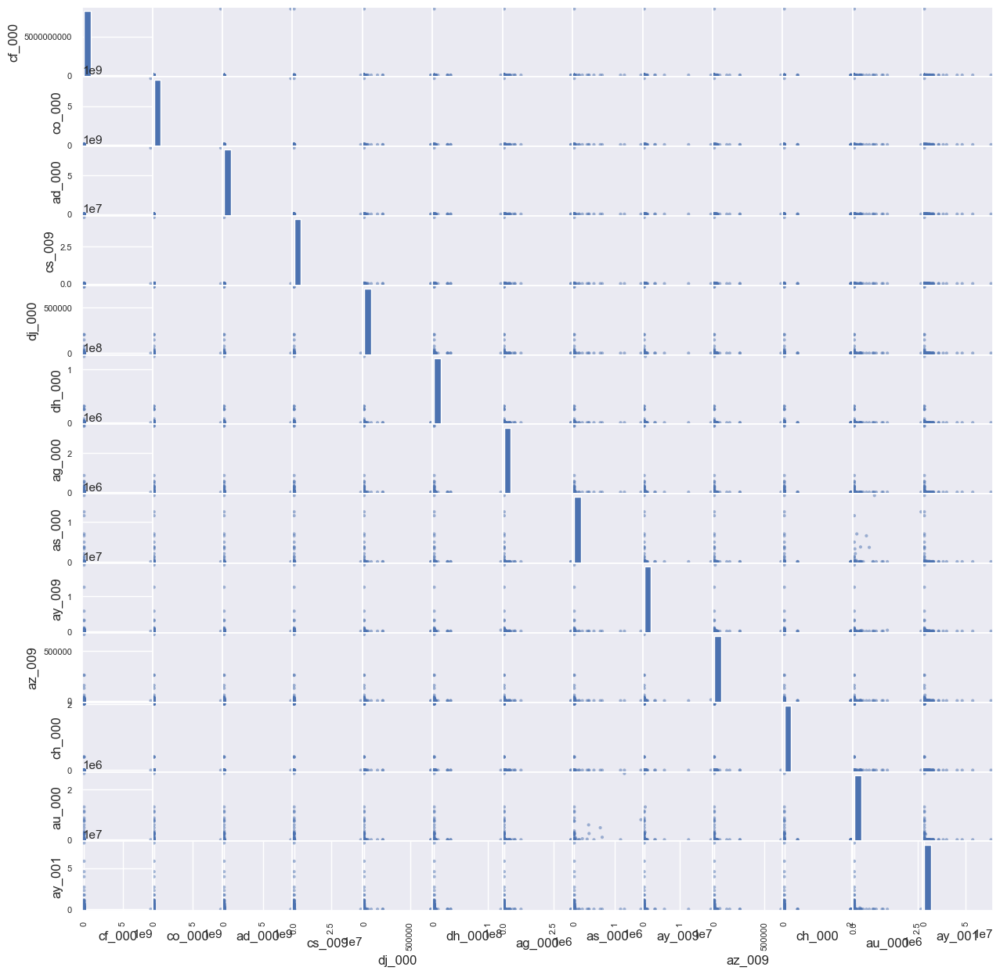

In [15]:
# Create scatter plot for the top 13 features

pd.plotting.scatter_matrix(top13_df, figsize=(15,15))
plt.show()

# From the scatter plots, we cannot concludethe significance of these features.

IndexError: index 12 is out of bounds for axis 0 with size 12

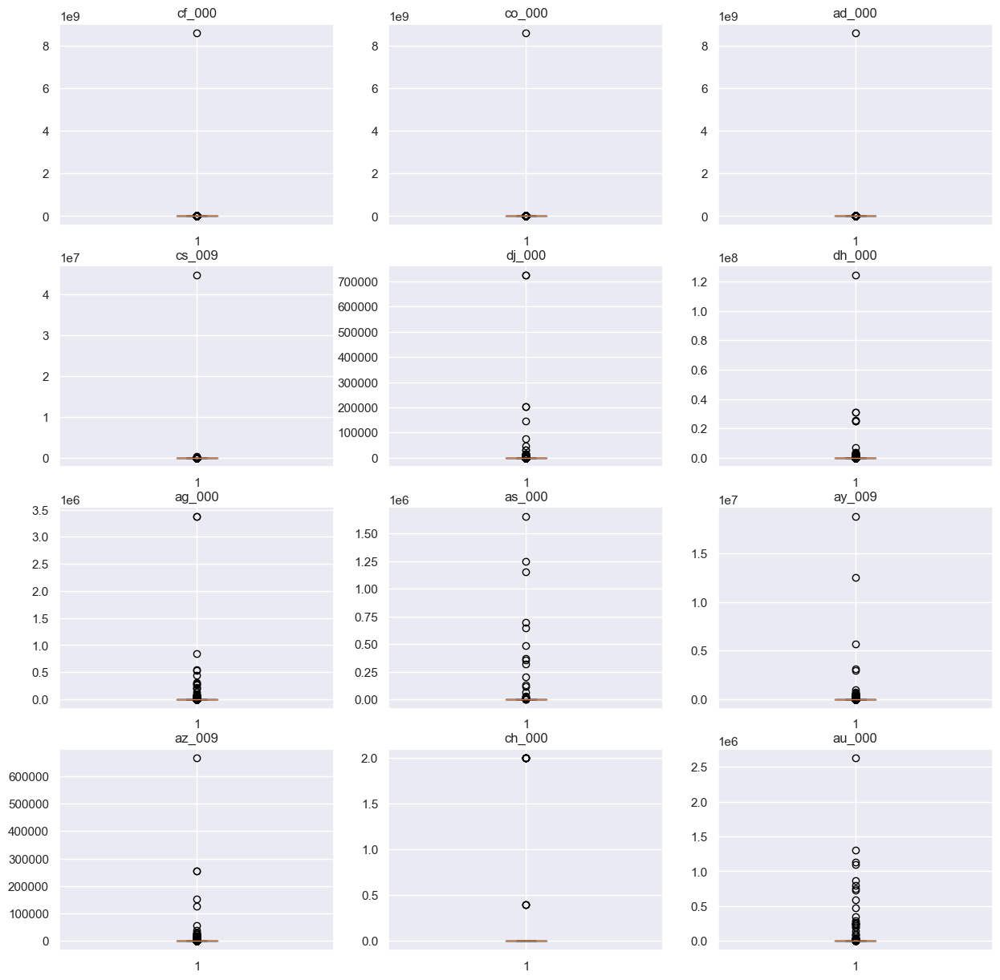

In [16]:
# Create boxplots for the top 13 features
fig, axs = plt.subplots(4, 3, figsize=(15,15))
axs = axs.flatten()
for i, feature in enumerate(top13_features):
    axs[i].boxplot(top13_df[feature])
    axs[i].set_title(feature)
plt.show()

#### <span style='color:black '>bv. Determine the number of positive and negative data. Is this data set imbalanced? <span>

In [17]:
print('''There are {:.2f} positive class in the imputed dataset'''
      .format((top13_df['class']=='pos').sum()))
print('''There are {:.2f} negative class in the imputed dataset'''
      .format((top13_df['class']=='neg').sum()))

print('''The pos/neg ratio in the imputed dataset is {:.2f} '''
      .format((top13_df['class']=='pos').sum()/(top13_df['class']=='neg').sum()))

# From the ratio, we can conclude that there is data imbalance in the imputed dataset

There are 1000.00 positive class in the imputed dataset
There are 59000.00 negative class in the imputed dataset
The pos/neg ratio in the imputed dataset is 0.02 


#### <span style='color:black/ '>(c) Train a random forest to classify the data set. Do NOT compensate for class imbalance in the data set. Calculate the confusion matrix, ROC, AUC, and misclassification for training and test sets and report them (You may use pROC package). Calculate Out of Bag error estimate for your random forset and compareit to the test error.<span>

In [18]:
pd.unique(test_imputed['class'])

array(['neg', 'pos'], dtype=object)

In [20]:
# change the 'neg' and 'pos' into 0 and 1 for the AUC purpose
y_train = y_train.replace({'neg': 0, 'pos': 1})
y_test = y_test.replace({'neg': 0, 'pos': 1})

# Train a random forest classifier with default hyperparameters
rf_clf = RandomForestClassifier(random_state=42)
rf_clf.fit(X_train_imputed, y_train)

# Make predictions on the training and test sets
train_preds = rf_clf.predict(X_train_imputed)
test_preds = rf_clf.predict(X_test_imputed_df)

# Calculate the confusion matrix for training and test sets
train_cm = confusion_matrix(y_train, train_preds)
test_cm = confusion_matrix(y_test, test_preds)



/Users/alberli/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


In [21]:
# Calculate ROC curve and AUC for training and test sets
train_fpr, train_tpr, _ = roc_curve(y_train, train_preds)
train_auc = auc(train_fpr, train_tpr)
test_fpr, test_tpr, _ = roc_curve(y_test, test_preds)
test_auc = auc(test_fpr, test_tpr)

# Calculate misclassification rate for training and test sets
train_misclassification = 1 - rf_clf.score(X_train_imputed, y_train)
test_misclassification = 1 - rf_clf.score(X_test_imputed, y_test)

# Calculate Out of Bag (OOB) error estimate for random forest
oob_error = 1 - rf_clf.oob_score

# Print the results
print("Confusion matrix for training set:\n", train_cm)
print("Confusion matrix for test set:\n", test_cm)
print("AUC for training set:", train_auc)
print("AUC for test set:", test_auc)
print("Misclassification rate for training set:", train_misclassification)
print("Misclassification rate for test set:", test_misclassification)
print("Out of Bag (OOB) error estimate for random forest:", oob_error)

Confusion matrix for training set:
 [[59000     0]
 [    1   999]]
Confusion matrix for test set:
 [[15613    12]
 [  120   255]]
AUC for training set: 0.9995
AUC for test set: 0.8396160000000001
Misclassification rate for training set: 1.666666666666483e-05
Misclassification rate for test set: 0.00824999999999998
Out of Bag (OOB) error estimate for random forest: 1


In [22]:
# Plot ROC curve for training set
plt.plot(train_fpr, train_tpr, color='blue', label='Training set (AUC = %0.2f)' % train_auc)
plt.plot(train_fpr, train_tpr, label='Train ROC Curve', linewidth=10)

# Plot ROC curve for test set
plt.plot(test_fpr, test_tpr, color='orange', label='Test set (AUC = %0.2f)' % test_auc)
plt.plot(test_fpr, test_tpr, label='Test ROC Curve', linewidth=10)

# Plot the line of random guessing
plt.plot([0, 1], [0, 1], color='black', linestyle='--')

# Set axis labels and title
plt.xlabel('False Positive Rate',fontsize=100)
plt.ylabel('True Positive Rate',fontsize=100)
plt.title('Receiver Operating Characteristic (ROC) Curve',fontsize=100)

# Add legend to the plot
plt.legend(fontsize=100)

# Show the plot
plt.show()

#### <span style='color:black'> (d) Research how class imbalance is addressed in random forests. Compensate for class imbalance in your random forest and repeat 1c. Compare the results with those of 1c.<span>

'classs_weight' parameter is used to compensate for class imbalance in the random forest package.  

In [26]:
# change the 'neg' and 'pos' into 0 and 1 for the AUC purpose
y_train = y_train.replace({'neg': 0, 'pos': 1})
y_test = y_test.replace({'neg': 0, 'pos': 1})

# Train a random forest classifier with default hyperparameters and balanced class weights
rf_clf_balanced = RandomForestClassifier(random_state=42, class_weight="balanced")
rf_clf_balanced.fit(X_train_imputed, y_train)

# Make predictions on the training and test sets
train_preds_balanced = rf_clf_balanced.predict(X_train_imputed)
test_preds_balanced = rf_clf_balanced.predict(X_test_imputed_df)

# Calculate the confusion matrix for training and test sets
train_cm_balanced = confusion_matrix(y_train, train_preds_balanced)
test_cm_balanced = confusion_matrix(y_test, test_preds_balanced)

# Calculate ROC curve and AUC for training and test sets
train_fpr_balanced, train_tpr_balanced, _ = roc_curve(y_train, train_preds_balanced)
train_auc_balanced = auc(train_fpr_balanced, train_tpr_balanced)

test_fpr_balanced, test_tpr_balanced, _ = roc_curve(y_test, test_preds_balanced)
test_auc_balanced = auc(test_fpr_balanced, test_tpr_balanced)

# Calculate misclassification rate for training and test sets
train_misclassification_balanced = 1 - rf_clf_balanced.score(X_train_imputed, y_train)
test_misclassification_balanced = 1 - rf_clf_balanced.score(test_imputed.drop('class', axis=1), y_test)

# Calculate Out of Bag (OOB) error estimate for random forest
oob_error_balanced = 1 - rf_clf_balanced.oob_score

# Print the results
print("Confusion matrix for training set (balanced):\n", train_cm_balanced)
print("Confusion matrix for test set (balanced):\n", test_cm_balanced)
print("AUC for training set (balanced):", train_auc_balanced)
print("AUC for test set (balanced):", test_auc_balanced)
print("Misclassification rate for training set (balanced):", train_misclassification_balanced)
print("Misclassification rate for test set (balanced):", test_misclassification_balanced)
print("Out of Bag (OOB) error estimate for random forest (balanced):", oob_error_balanced)

# Plot ROC curve for training set (balanced)
plt.plot(train_fpr_balanced, train_tpr_balanced, color='blue', label='Training set (AUC = %0.2f)' % train_auc_balanced)
plt.plot(train_fpr_balanced, train_tpr_balanced, label='Train ROC Curve (balanced)', linewidth=10)

# Plot ROC curve for test set (balanced)
plt.plot(test_fpr_balanced, test_tpr_balanced, color='orange', label='Test set (AUC = %0.2f)' % test_auc_balanced)
plt.plot(test_fpr_balanced, test_tpr_balanced, label='Test ROC Curve (balanced)', linewidth=10)

# Plot the line of random guessing
plt.plot([0, 1], [0, 1], color='black', linestyle='--')

# Set axis labels and title
plt.xlabel('False Positive Rate',fontsize=100)
plt.ylabel('True Positive Rate',fontsize=100)
plt.title('Receiver Operating Characteristic (ROC) Curve',fontsize=100)

# Add legend to the plot
plt.legend(fontsize=100)

# Show the plot
plt.show()

/Users/alberli/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


Confusion matrix for training set (balanced):
 [[59000     0]
 [    1   999]]
Confusion matrix for test set (balanced):
 [[15611    14]
 [  164   211]]
AUC for training set (balanced): 0.9995
AUC for test set (balanced): 0.7808853333333333
Misclassification rate for training set (balanced): 1.666666666666483e-05
Misclassification rate for test set (balanced): 0.011125000000000052
Out of Bag (OOB) error estimate for random forest (balanced): 1


### <span style='color:blue'>  Comparing with 1c, the training AUC is the same, while the test AUC and miscalssification rate for test set on the balanced dataset is actually performing worse

#### <span style='color:black'> (e) XGBoost and Model Trees[<sup>5</sup>](#fn5). Report the Confusion Matrix, ROC, and AUC for training and test sets. <span>



In [28]:
# XGBoost

# fit XGBoost classifier on the training data
xgb_clf = xgb.XGBClassifier(random_state=42)
xgb_clf.fit(X_train_imputed, y_train)

# make predictions on the training and test data
train_preds = xgb_clf.predict(X_train_imputed)
test_preds = xgb_clf.predict(X_test_imputed)

# calculate the confusion matrix for training and test data
train_cm = confusion_matrix(y_train, train_preds)
test_cm = confusion_matrix(y_test, test_preds)

# calculate the ROC curve and AUC for training and test data
train_fpr, train_tpr, _ = roc_curve(y_train, train_preds)
train_auc = auc(train_fpr, train_tpr)
test_fpr, test_tpr, _ = roc_curve(y_test, test_preds)
test_auc = auc(test_fpr, test_tpr)

# print the results
print("XGBoost - Confusion matrix for training set:\n", train_cm)
print("XGBoost - Confusion matrix for test set:\n", test_cm)
print("XGBoost - AUC for training set:", train_auc)
print("XGBoost - AUC for test set:", test_auc)

# Plot ROC curve for training set
plt.plot(train_fpr, train_tpr, color='blue', label='Training set (AUC = %0.2f)' % train_auc)
plt.plot(train_fpr, train_tpr, label='Train ROC Curve', linewidth=10)

# Plot ROC curve for test set
plt.plot(test_fpr, test_tpr, color='orange', label='Test set (AUC = %0.2f)' % test_auc)
plt.plot(test_fpr, test_tpr, label='Test ROC Curve', linewidth=10)

# Plot the line of random guessing
plt.plot([0, 1], [0, 1], color='black', linestyle='--')

# Set axis labels and title
plt.xlabel('False Positive Rate',fontsize=100)
plt.ylabel('True Positive Rate',fontsize=100)
plt.title('Receiver Operating Characteristic (ROC) Curve',fontsize=100)

# Add legend to the plot
plt.legend(fontsize=100)

# Show the plot
plt.show()

XGBoost - Confusion matrix for training set:
 [[59000     0]
 [    0  1000]]
XGBoost - Confusion matrix for test set:
 [[15611    14]
 [   88   287]]
XGBoost - AUC for training set: 1.0
XGBoost - AUC for test set: 0.8822186666666667


In [29]:
# Model Tree

# Fit a model tree classifier with default hyperparameters
tree_clf = DecisionTreeClassifier(random_state=42)
tree_clf.fit(X_train_imputed, y_train)

# Make predictions on the training and test sets
train_preds = tree_clf.predict(X_train_imputed)
test_preds = tree_clf.predict(X_test_imputed_df)

# Calculate the confusion matrix for training and test sets
train_cm = confusion_matrix(y_train, train_preds)
test_cm = confusion_matrix(y_test, test_preds)

# Calculate ROC curve and AUC for training and test sets
train_fpr, train_tpr, _ = roc_curve(y_train, train_preds)
train_auc = auc(train_fpr, train_tpr)
test_fpr, test_tpr, _ = roc_curve(y_test, test_preds)
test_auc = auc(test_fpr, test_tpr)

# Calculate misclassification rate for training and test sets
train_misclassification = 1 - tree_clf.score(X_train_imputed, y_train)
test_misclassification = 1 - tree_clf.score(X_test_imputed_df, y_test)

# Print the results
print("Confusion matrix for training set:\n", train_cm)
print("Confusion matrix for test set:\n", test_cm)
print("AUC for training set:", train_auc)
print("AUC for test set:", test_auc)
print("Misclassification rate for training set:", train_misclassification)
print("Misclassification rate for test set:", test_misclassification)

# Plot ROC curve for training set
plt.plot(train_fpr, train_tpr, color='blue', label='Training set (AUC = %0.2f)' % train_auc)
plt.plot(train_fpr, train_tpr, label='Train ROC Curve', linewidth=10)

# Plot ROC curve for test set
plt.plot(test_fpr, test_tpr, color='orange', label='Test set (AUC = %0.2f)' % test_auc)
plt.plot(test_fpr, test_tpr, label='Test ROC Curve', linewidth=10)

# Plot the line of random guessing
plt.plot([0, 1], [0, 1], color='black', linestyle='--')

# Set axis labels and title
plt.xlabel('False Positive Rate',fontsize=100)
plt.ylabel('True Positive Rate',fontsize=100)
plt.title('Receiver Operating Characteristic (ROC) Curve',fontsize=100)

# Add legend to the plot
plt.legend(fontsize=100)
# Show the plot
plt.show()


/Users/alberli/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
/Users/alberli/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


Confusion matrix for training set:
 [[59000     0]
 [    0  1000]]
Confusion matrix for test set:
 [[15559    66]
 [  108   267]]
AUC for training set: 1.0
AUC for test set: 0.853888
Misclassification rate for training set: 0.0
Misclassification rate for test set: 0.010874999999999968


#### <span style='color:black'> (f) Use SMOTE (Synthetic Minority Over-sampling Technique) to pre-process your data to compensate for class imbalance.[<sup>4</sup>](#fn4) Train XGBosst with L1-penalized logistic regression at each node using the pre-processed data and repeat 1e. Do not forget that there is a right and a wrong way of cross validation here. Compare the uncompensated case with SMOTE case. <span>

In [30]:
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import GridSearchCV
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
t1 = datetime.now()
# Define the pipeline
pipeline = Pipeline([
    ('smote', SMOTE(sampling_strategy='auto', random_state=42,n_jobs=-1)),
    ('xgb', XGBClassifier(objective='binary:logistic'))
])

# Define the parameter grid for cross-validation
param_grid = {'xgb__reg_alpha': [0, 0.001, 0.01, 0.1, 1, 10, 100]}

# Perform grid search cross-validation to find the optimal value of alpha
grid_search = GridSearchCV(pipeline, param_grid, cv=5)
grid_search.fit(X_train_imputed, y_train)

t2 = datetime.now()
print(t2-t1)
# Print the best value of alpha and corresponding mean test score
print("Best alpha value: {:.3f}".format(grid_search.best_params_['xgb__reg_alpha']))
print("Corresponding mean test score: {:.2f}".format(grid_search.best_score_))


/Users/alberli/opt/anaconda3/lib/python3.9/site-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
/Users/alberli/opt/anaconda3/lib/python3.9/site-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
/Users/alberli/opt/anaconda3/lib/python3.9/site-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
/Users/alberli/opt/anaconda3/lib/python3.9/site-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: 

/Users/alberli/opt/anaconda3/lib/python3.9/site-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
/Users/alberli/opt/anaconda3/lib/python3.9/site-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
/Users/alberli/opt/anaconda3/lib/python3.9/site-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(
/Users/alberli/opt/anaconda3/lib/python3.9/site-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: 

0:15:10.513876
Best alpha value: 0.100
Corresponding mean test score: 0.99


In [31]:
# Fit an XGBoost model with the optimal alpha value and evaluate its performance on the test set
X_train_resampled, y_train_resampled = pipeline.named_steps['smote'].fit_resample(X_train_imputed, y_train)

train_preds = grid_search.predict(X_train_resampled)

test_preds = grid_search.predict(X_test_imputed)

test_error_xg = mean_squared_error(y_test, test_preds)
print("Test error: {:.2f}".format(test_error_xg))

/Users/alberli/opt/anaconda3/lib/python3.9/site-packages/imblearn/over_sampling/_smote/base.py:336: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(


Test error: 0.01


In [33]:
# Calculate the confusion matrix for training and test sets

train_cm = confusion_matrix(y_train_resampled, train_preds.astype('int64'))
test_cm = confusion_matrix(y_test, test_preds.astype('int64'))

# Calculate ROC curve and AUC for training and test sets
train_fpr, train_tpr, _ = roc_curve(y_train_resampled, train_preds.astype('int64'))
train_auc = auc(train_fpr, train_tpr)
test_fpr, test_tpr, _ = roc_curve(y_test, test_preds.astype('int64'))
test_auc = auc(test_fpr, test_tpr)

# Calculate misclassification rate for training and test sets
train_misclassification = 1 - tree_clf.score(X_train_resampled, y_train_resampled)
test_misclassification = 1 - tree_clf.score(X_test_imputed_df, y_test)

# Print the results
print("Confusion matrix for training set:\n", train_cm)
print("Confusion matrix for test set:\n", test_cm)
print("AUC for training set:", train_auc)
print("AUC for test set:", test_auc)
print("Misclassification rate for training set:", train_misclassification)
print("Misclassification rate for test set:", test_misclassification)

# Plot ROC curve for training set
plt.plot(train_fpr, train_tpr, color='blue', label='Training set (AUC = %0.2f)' % train_auc)
plt.plot(train_fpr, train_tpr, label='Train ROC Curve', linewidth=10)

# Plot ROC curve for test set
plt.plot(test_fpr, test_tpr, color='orange', label='Test set (AUC = %0.2f)' % test_auc)
plt.plot(test_fpr, test_tpr, label='Test ROC Curve', linewidth=10)

# Plot the line of random guessing
plt.plot([0, 1], [0, 1], color='black', linestyle='--')

# Set axis labels and title
plt.xlabel('False Positive Rate',fontsize=100)
plt.ylabel('True Positive Rate',fontsize=100)
plt.title('Receiver Operating Characteristic (ROC) Curve',fontsize=100)

# Add legend to the plot
plt.legend(fontsize=100)
# Show the plot
plt.show()


/Users/alberli/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


Confusion matrix for training set:
 [[59000     0]
 [    0 59000]]
Confusion matrix for test set:
 [[15571    54]
 [   70   305]]
AUC for training set: 1.0
AUC for test set: 0.9049386666666667
Misclassification rate for training set: 0.10886440677966103
Misclassification rate for test set: 0.010874999999999968


### <span style='color:black '> 2. ISLR 6.6.3 <span>

### <span style="color:blue"> a) iv. steadily decrease </span>
### <span style="color:blue"> b) ii. decrease initially, and then eventually start increasing in a U shape </span>
### <span style="color:blue"> c) iii. steadily increase </span>
### <span style="color:blue"> d) iv. steadily decrease </span>
### <span style="color:blue"> e) v. remain constant </span>

### <span style='color:black '> 3. ISLR 6.6.5 <span>

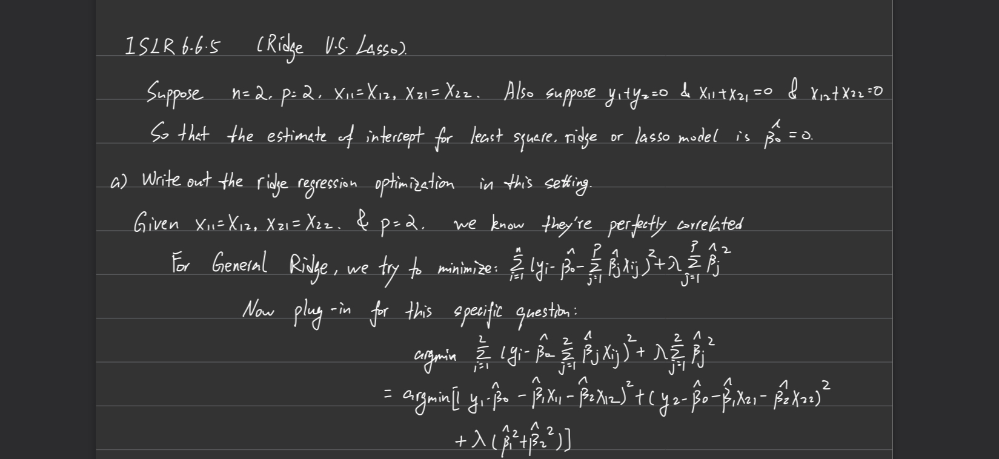

In [34]:
image_a = Image.open("../data/6.6.5_a.jpeg")
image_a

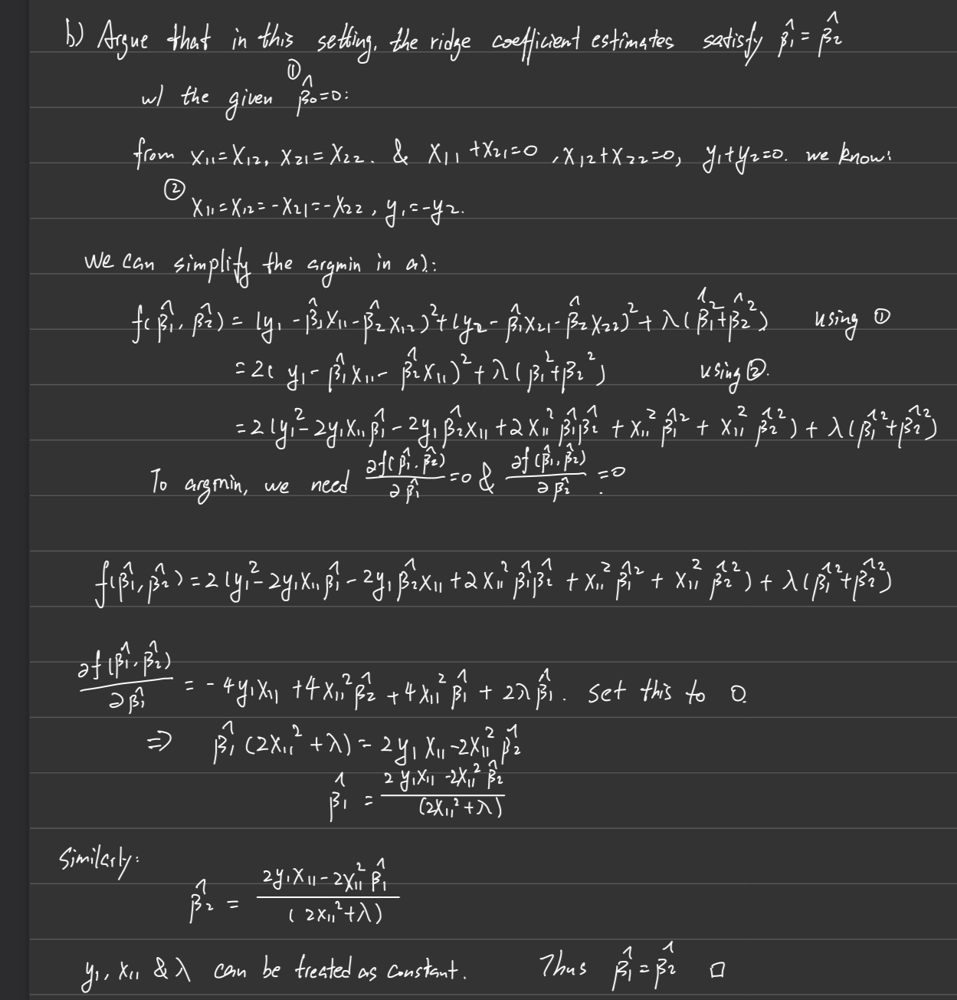

In [35]:
image_b = Image.open("../data/6.6.5_b.jpeg")
image_b

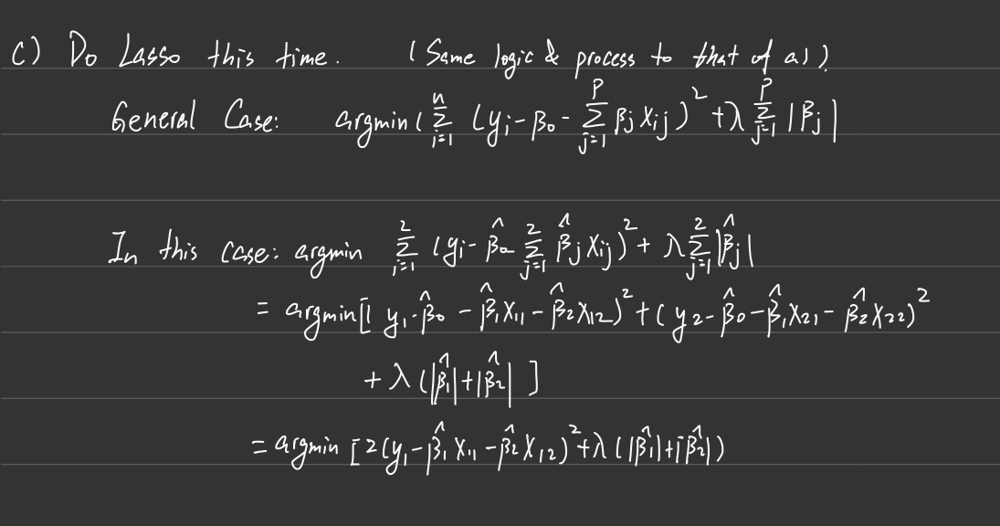

In [36]:
image_c = Image.open("../data/6.6.5_c.jpeg")
image_c

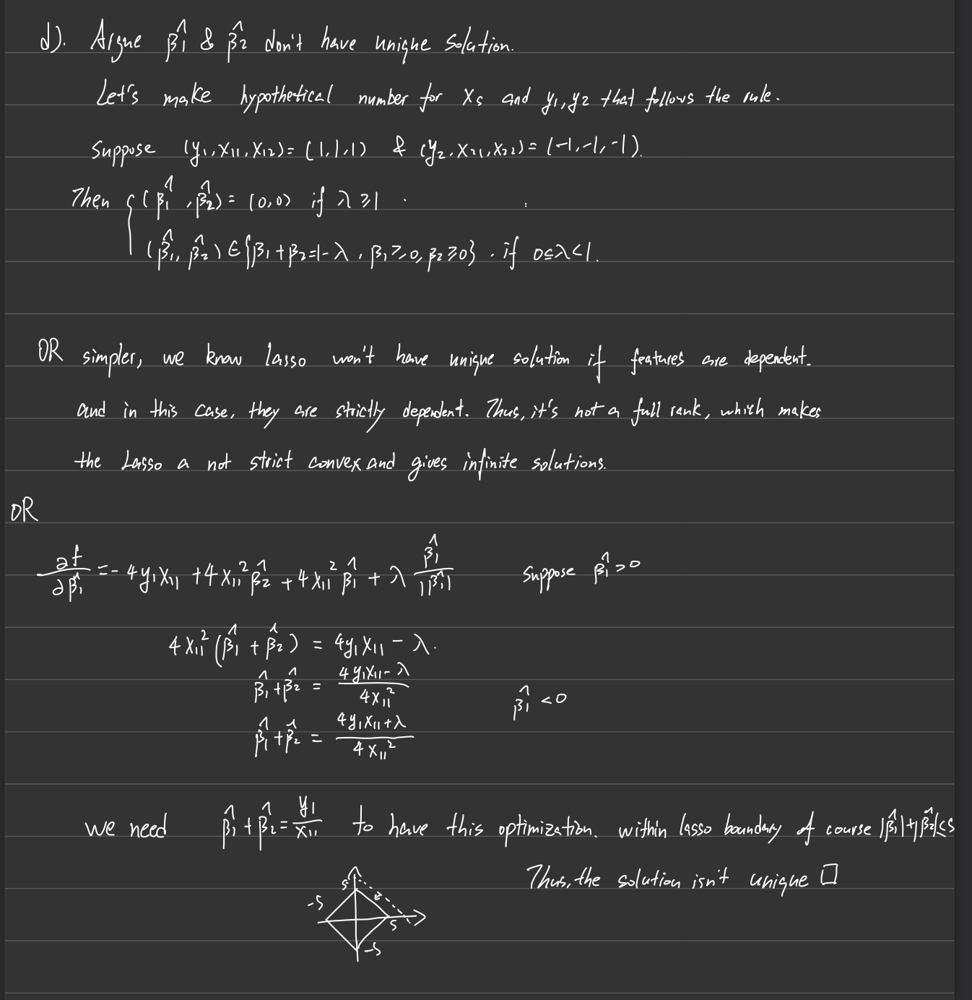

In [37]:
image_d = Image.open("../data/6.6.5_d.jpeg")
image_d

### <span style='color:black '> 4. ISLR 8.4.5 <span>

### <span style="color:blue">- majority vote: 6 vs 4 –> red</span><br>
### <span style="color:blue">- avg. prob: P(Class is Red|X) = 4.5/10 = 0.45 –> green</span>


### <span style='color:black'> 5. ISLR 9.7.3 <span>

# I have another file inside the notebook folder that has the final answer for this question. They have the same code, but somehow jupyter notebook gave me different plots. Thus, please use the other file with name 'Xiang_Li_DSCI552 HW6_ISLR 9.7.3 ' for grading. Thank you.

### (a) Plot Observations & (b) Optimal Separating Hyperplane


In [41]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl

df = pd.DataFrame({
    'obs': [1, 2, 3, 4, 5, 6, 7],
    'X1': [3, 2, 4, 1, 2, 4, 4],
    'X2': [4, 2, 4, 4, 1, 3, 1],
    'Y': ['red', 'red', 'red', 'red', 'blue', 'blue', 'blue']
})

colors = {'red': 'r', 'blue': 'b'}
df['color'] = df['Y'].apply(lambda x: colors[x])

plt.scatter(df['X1'], df['X2'], c=df['color'])
plt.xlim(0.5, 4.5)
plt.ylim(0.5, 4.5)
plt.xlabel('X_1')
plt.ylabel('X_2')
plt.show()

#calculate a, b, c for the line equation
x_0 = 2
y_0 = 1
a = -1
b = 1
c = a * x_0 + b * y_0

#plot the figure
plt.figure(figsize=(8, 8))
plt.plot(perp_lines.loc[0:1, 'X1'], perp_lines.loc[0:1, 'X2'], linestyle='dotted', color='grey')
plt.plot(perp_lines.loc[2:3, 'X1'], perp_lines.loc[2:3, 'X2'], linestyle='dotted', color='grey')
plt.plot(perp_lines
         .loc[4:5, 'X1'], perp_lines.loc[4:5, 'X2'], linestyle='dotted', color='grey')
plt.plot(perp_lines.loc[6:7, 'X1'], perp_lines.loc[6:7, 'X2'], linestyle='dotted', color='grey')
plt.scatter(df['X1'], df['X2'], c=df['Y'], s=50)
plt.plot([0, 5], [-0.5, 4.5], color='black')
plt.xlim(0.5, 4.5)
plt.ylim(0.5, 4.5)
plt.xlabel(r'$X_1$')
plt.ylabel(r'$X_2$')
plt.gca().set_aspect('equal', adjustable='box')
plt.show()


NameError: name 'perp_lines' is not defined

<Figure size 800x800 with 0 Axes>

###  (c) Describe the classification rule for the maximal margin classifier. It should be something along the lines of "Classify to Red if β0+β1X1+β2X2>0, and classify to Blue otherwise. Provide the values for β0, β1 and β2.


### <span style="color:blue">Following from the previous line equationL: X2=X1−0.5, we can have the classification rule as: X2−X1+0.5>0 is red, otherwise, it's blue.<span>

### <span style="color:blue">f(X)=X2−X1+0.5 -> (β0, β1, β2) = (0.5,-1,1)<span>

### (d) Margin for the maximal margin hyperplane

In [42]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Create grid
x1 = np.linspace(0.5, 4.5, 401)
x2 = np.linspace(0.5, 4.5, 401)
xx1, xx2 = np.meshgrid(x1, x2)
grid = pd.DataFrame({'X1': xx1.ravel(), 'X2': xx2.ravel()})

grid['region'] = np.where(grid['X2'] > grid['X1'] - 0.5,  '#FFB6C1', '#ADD8E6')

# Define colors
colors = {'red': 'r', 'blue': 'b'}

# Add color column to df
df['color'] = df['Y'].apply(lambda x: colors[x])

# Create plot
fig, ax = plt.subplots()

# Add tiles
ax.scatter(grid['X1'], grid['X2'], c=grid['region'], alpha=0.1, cmap='coolwarm', s=1)

# Add points
ax.scatter(df['X1'], df['X2'], c=df['color'], cmap='bwr', s=2)

# Add lines
ax.plot(x1, x1 - 0.5, 'k', linewidth=1)
ax.plot(x1, x1 - 1, 'k--', linewidth=1)
ax.plot(x1, x1, 'k--', linewidth=1)

# Adjust dashed lines to pass through points
ax.plot([2, 4], [1, 3], 'k--', linewidth=1, color='grey')
ax.plot([2, 4], [2, 4], 'k--', linewidth=1, color='grey')

# Set axis limits
ax.set_xlim(0.5, 4.5)
ax.set_ylim(0.5, 4.5)

plt.show()


/var/folders/bl/cyzb7l7939lg7l3437y92vc00000gn/T/ipykernel_92239/2221746869.py:34: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  ax.plot([2, 4], [1, 3], 'k--', linewidth=1, color='grey')
/var/folders/bl/cyzb7l7939lg7l3437y92vc00000gn/T/ipykernel_92239/2221746869.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  ax.plot([2, 4], [2, 4], 'k--', linewidth=1, color='grey')


### (e) Indicate the support vectors for the maximal margin classifier

In [43]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Create grid
x1 = np.linspace(0.5, 4.5, 401)
x2 = np.linspace(0.5, 4.5, 401)
xx1, xx2 = np.meshgrid(x1, x2)
grid = pd.DataFrame({'X1': xx1.ravel(), 'X2': xx2.ravel()})

grid['region'] = np.where(grid['X2'] > grid['X1'] - 0.5,  '#FFB6C1', '#ADD8E6')

# Define colors
colors = {'red': 'r', 'blue': 'b'}

# Add color column to df
df['color'] = df['Y'].apply(lambda x: colors[x])

# Create plot
fig, ax = plt.subplots()

# Add tiles
ax.scatter(grid['X1'], grid['X2'], c=grid['region'], alpha=0.1, cmap='coolwarm', s=1)

# Add points
ax.scatter(df['X1'], df['X2'], c=df['color'], cmap='bwr', s=2)

# Add lines
ax.plot(x1, x1 - 0.5, 'k', linewidth=1)
ax.plot(x1, x1 - 1, 'k--', linewidth=1)
ax.plot(x1, x1, 'k--', linewidth=1)

# Adjust dashed lines to pass through points
ax.plot([2, 4], [1, 3], 'k--', linewidth=1, color='grey')
ax.plot([2, 4], [2, 4], 'k--', linewidth=1, color='grey')

# Add triangles at the end points of the dashed lines to mark the support vectors
ax.plot([2, 4], [1, 3], 'k^', markersize=7, color='blue', fillstyle='none')
ax.plot([2, 4], [2, 4], 'k^', markersize=7, color='red', fillstyle='none')

# Set axis limits
ax.set_xlim(0.5, 4.5)
ax.set_ylim(0.5, 4.5)

plt.show()


/var/folders/bl/cyzb7l7939lg7l3437y92vc00000gn/T/ipykernel_92239/2723526930.py:34: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  ax.plot([2, 4], [1, 3], 'k--', linewidth=1, color='grey')
/var/folders/bl/cyzb7l7939lg7l3437y92vc00000gn/T/ipykernel_92239/2723526930.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  ax.plot([2, 4], [2, 4], 'k--', linewidth=1, color='grey')
/var/folders/bl/cyzb7l7939lg7l3437y92vc00000gn/T/ipykernel_92239/2723526930.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k^" (-> color='k'). The keyword argument will take precedence.
  ax.plot([2, 4], [1, 3], 'k^', markersize=7, color='blue', fillstyle='none')
/var/folders/bl/cyzb7l7939lg7l3437y92vc00000gn/T/ipykernel_92239/2723526930.py:3

### (f) Argue that a slight movement of the seventh observation would not affect the maximal margin hyperplane.

### <span style="color:blue">7th point is [4,1] -> Blue, and it's classified as blue as well. Since it's not a support vector, slight change, perhaps change it to (3,1) wouldn't affect the line nor the predicted outcome for any point.<span>

### (g) Non-Optimal Hyperplan: Sketch a hyperplane that is not the optimal separating hyperplane, and provide the equation for this hyperplane

In [44]:
# I changed the function from the optimal f(X)=X2−X1+0.5 into X2−0.8*X1+0.1
# It's clear to see that the buffer zone is smaller than the optimal one

# Create grid
x1 = np.linspace(0.5, 4.5, 401)
x2 = np.linspace(0.5, 4.5, 401)
xx1, xx2 = np.meshgrid(x1, x2)
grid = pd.DataFrame({'X1': xx1.ravel(), 'X2': xx2.ravel()})

grid['region'] = np.where(grid['X2'] > 0.8*grid['X1'] + 0.1, '#FFB6C1', '#ADD8E6')

# Define colors
colors = {'red': 'r', 'blue': 'b'}

# Add color column to df
df['color'] = df['Y'].apply(lambda x: colors[x])

# Create plot
fig, ax = plt.subplots()

# Add tiles
ax.scatter(grid['X1'], grid['X2'], c=grid['region'], alpha=0.1, cmap='coolwarm', s=1)

# Add points
ax.scatter(df['X1'], df['X2'], c=df['color'], cmap='bwr', s=2)

# Add lines
ax.plot(x1, 0.8*x1 +0.1, 'k', linewidth=1)
ax.plot(x1, 0.8*x1 +0.4, 'k--', linewidth=1)
ax.plot(x1, 0.8*x1-0.2 , 'k--', linewidth=1)

# Adjust dashed lines to pass through points
ax.plot([2, 4], [1.4, 3], 'k--', linewidth=1, color='grey')
ax.plot([2, 4], [2, 3.6], 'k--', linewidth=1, color='grey')

# Set axis limits
ax.set_xlim(0.5, 4.5)
ax.set_ylim(0.5, 4.5)

plt.show()


/var/folders/bl/cyzb7l7939lg7l3437y92vc00000gn/T/ipykernel_92239/2434644554.py:33: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  ax.plot([2, 4], [1.4, 3], 'k--', linewidth=1, color='grey')
/var/folders/bl/cyzb7l7939lg7l3437y92vc00000gn/T/ipykernel_92239/2434644554.py:34: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  ax.plot([2, 4], [2, 3.6], 'k--', linewidth=1, color='grey')


### (h) Draw an additional observation on the plot so that the two classes are no longer separable by a hyperplane

In [45]:
# We could add (3,1):red, then this would be no longer separable by a hyperplane
df1 = pd.DataFrame({
    'obs': [1, 2, 3, 4, 5, 6, 7, 8],
    'X1': [3, 2, 4, 1, 2, 4, 4, 3],
    'X2': [4, 2, 4, 4, 1, 3, 1, 1],
    'Y': ['red', 'red', 'red', 'red', 'blue', 'blue', 'blue','red']
})

colors = {'red': 'r', 'blue': 'b'}
df1['color'] = df1['Y'].apply(lambda x: colors[x])

plt.scatter(df1['X1'], df1['X2'], c=df1['color'])
plt.xlim(0.5, 4.5)
plt.ylim(0.5, 4.5)
plt.xlabel('X_1')
plt.ylabel('X_2')
plt.show()



#### 6. Extra Practice: ISLR 5.4.2, 6.8.4, 8.4.4, 9.7.2

##### <span style='color:green '> Footnote section <span>

<span id="fn1"> 1. In reality, when we have a model and we want to  ll in missing values, we do not have access to training data, so we only use the statistics of test data to  ll in the missing values.<span>  
<span id="fn2"> 2. They are called data imputation techniques. <span>  
<span id="fn3"> 3. You are welcome to test more than one method.<span>  
<span id="fn4"> 4. If you did not start doing this homework on time, downsample the common class to 6,000 so that you have 12,000 data points after applying SMOTE. Remember that the purpose of this homework is to apply SMOTE to the whole training set, not the downsampled dataset.<span>
    
<span id='fn5'> 5. In the case of a univariate tree, only one input dimension is used at a tree split. In a multivariate tree, or model tree, at a decision node all input dimensions can be used and thus it is more general. In univariate classification trees, majority polling is used at each node to determine the split of that node as the decision rule. In model trees, a (linear) model that relies on all of the variables is used to determine the split of that node (i.e. instead of using Xj > s as the decision rule, one has $ \sum_{j} \beta_{j}X_{j} > s $	 as the decision rule).  
Alternatively, in a regression tree, instead of using average in the region associated with each node, a linear regression model is used to determine the value associated with that node.  
One of the methods that can be used at each node is Logistic Regression. Because the number of variables is large in this problem, one can use L1-penalized logistic regression at each node. You can use XGBoost to  fit the model tree. Determine  (the regularization term) using cross-validation. Train the model for the APS data set without compensation for class imbalance. Use one of 5 fold, 10 fold, and leave-one-out cross validation methods to estimate the error of your trained model and compare it with the test error. <span>